# Get Clusters and Stats

<br/>

<pre>
model name:            imagewoof_128_resnet18_model.pth
network architecture:  resnet18
dataset:               imagewoof training and calibration set
image size:            128x128 (resized beforehand)
</pre>

<br/>

We want to test our Out-of-Distribution (OoD) detection method __Layer-wise Activation Cluster Analysis (LACA)__ on a dataset that is more complex than the MNIST, SVHN or the CIFAR-10 dataset which have been used so far. We chose the [Imagewoof dataset](https://github.com/fastai/imagenette) as it contains images showing more complex scenes. The [Imagewoof dataset](https://github.com/fastai/imagenette) is a subset of 10 classes of the [ImageNet dataset](https://www.image-net.org/). 

The first step of our OoD detection method is executed before inference. Here we measure in-distribution statistics from the training data and OoD statistics from the calibration data. Both kind of statistics are necessary to calculate the credibility of a test sample at inference. 

After receiving the projections from the training set (see __03_get_projections_trainset_imagewoof_128_resnet18.ipynb__) and the calibration set (see __04_join_projections_trainset_imagewoof_128_resnet18.ipynb__) we search for clusters in the projections from the training set. From these clusters we obtain cluster statistics, calculate layer weights and use the cluster models to obtain cluster statistics from the calibration set as well.

<br/>

_Sources:_
* [Imagewoof dataset](https://github.com/fastai/imagenette)
* [Deep kNN paper](https://arxiv.org/abs/1803.04765)
* [Deep kNN sample code](https://github.com/cleverhans-lab/cleverhans/blob/master/cleverhans_v3.1.0/cleverhans/model_zoo/deep_k_nearest_neighbors/dknn.py)
* [Deep kNN sample code (PyTorch)](https://github.com/bam098/deep_knn/blob/master/dknn_mnist.ipynb)

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.functional import adaptive_avg_pool2d
from torch.utils.data import DataLoader
import torchvision
from torchvision import transforms, models, datasets
import sklearn
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import metrics
import skimage
from skimage.measure import block_reduce
from umap import UMAP
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pickle
import numpy as np
import platform
from pathlib import Path
import random
import warnings
import pprint
from collections import Counter

sns.set()
sns.set_context("notebook", font_scale=1.1)
sns.set_style("ticks")

print('python version:      {}'.format(platform.python_version()))
print('torch version:       {}'.format(torch.__version__))
print('torchvision version: {}'.format(torchvision.__version__))
print('sklearn version:     {}'.format(sklearn.__version__))
print('skimage version:     {}'.format(skimage.__version__))
print('numpy version:       {}'.format(np.__version__))
print('matplotlib version:  {}'.format(matplotlib.__version__))
print('seaborn version:     {}'.format(sns.__version__))
print('pandas version:      {}'.format(pd.__version__))
print('pickle version:      {}'.format(pickle.format_version))

use_cuda = torch.cuda.is_available()
print('CUDA available:      {}'.format(use_cuda))
print('cuDNN enabled:       {}'.format(torch.backends.cudnn.enabled))
print('num gpus:            {}'.format(torch.cuda.device_count()))

if use_cuda:
    print('gpu:                 {}'.format(torch.cuda.get_device_name(0)))

    print()
    print('------------------------- CUDA -------------------------')
    ! nvcc --version

python version:      3.6.9
torch version:       1.7.0
torchvision version: 0.8.1
sklearn version:     0.23.2
skimage version:     0.17.2
numpy version:       1.19.5
matplotlib version:  3.2.2
seaborn version:     0.11.0
pandas version:      1.1.4
pickle version:      4.0
CUDA available:      False
cuDNN enabled:       True
num gpus:            0


We set the seed values to obtain reproducible results. For more information how to set seed values in Python and Pytorch see the [Pytorch documentation](https://pytorch.org/docs/1.7.0/notes/randomness.html?highlight=repro).

In [ ]:
seed = 0
torch.manual_seed(seed)
random.seed(seed)
np.random.seed(seed)

torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True
torch.set_deterministic(True)

## Parameters

In [ ]:
# Projections
img_size          = 128                                                             # Image size
num_classes       = 10                                                              # Number of classes
base_projs_folder = Path('/Users/lehmann/research/laca3/projections/imagewoof')     # Base projection folder
pfname_string     = 'imagewoof_{}_resnet18_projs'.format(img_size)                  # Projections file name
projs_path        = base_projs_folder/pfname_string                                 # Projections path
layer_names       = [                                                               # List of layer names 
    'relu',
    'maxpool',
    'layer1-0',
    'layer1-1',
    'layer2-0',
    'layer2-1',
    'layer3-0',
    'layer3-1',
    'layer4-0',
    'layer4-1',
    'avgpool'
]

# Clusters and Stats
base_cstats_folder = Path('/Users/lehmann/research/laca3/cluster_stats/imagewoof')  # Base projection folder
cfname_string     = 'imagewoof_{}_resnet18_cstats'.format(img_size)                 # Projections file name
cstats_path        = base_cstats_folder/cfname_string                               # Activations path

## Define Function for Plotting Projections and Clusters

In [ ]:
def plot_projects(projections, cluster_labels=None, cluster_centers=None):
    layers = list(projections['projections'].keys())
    
    for layer_name in layers:        
        df = pd.DataFrame()
        df['x'] = projections['projections'][layer_name][:,0]
        df['y'] = projections['projections'][layer_name][:,1]
        
        if cluster_labels is not None:
            df['targets'] = cluster_labels[layer_name]
        else:
            df['targets'] = projections['targets']
    
        plot = sns.lmplot(
            x='x', y='y', data=df, fit_reg=False, hue='targets', height=8, palette='muted', legend=False,
            scatter_kws={'marker': 'D', 's': 50, 'alpha': 0.6}
        ).set_axis_labels('x1','x2')
    
        if cluster_labels is not None:
            plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        else:
            plt.legend(title='Object Class', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
            
        if cluster_centers is not None:
            plt.plot(*zip(*cluster_centers[layer_name]), marker='x', color='black', ls='', markersize=14, markeredgewidth=2)
    
        fig = plot.fig
        fig.suptitle('Projections from Layer {}'.format(layer_name), y=1.025, fontsize = 20)

## Load Trainset Projections

In [ ]:
loaded_train_projections = {}

fname = str(projs_path) + '_{}_all.pkl'.format('trainset')
with open(fname, 'rb') as pickle_file:
    loaded_train_projections = pickle.load(pickle_file)

In [ ]:
print('targets: {}'.format(loaded_train_projections['targets'].shape))
print()

for layer_name in layer_names:
    print('## layer {}'.format(layer_name))
    print('projections: {}'.format(loaded_train_projections['projections'][layer_name].shape))
    print('scaler:      {}'.format(loaded_train_projections['scaler'][layer_name]))
    print('reducer:     {}'.format(loaded_train_projections['reducer'][layer_name]))
    print()

targets: (9025,)

## layer relu
projections: (9025, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer maxpool
projections: (9025, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer layer1-0
projections: (9025, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer layer1-1
projections: (9025, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer layer2-0
projections: (9025, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer layer2-1
projections: (9025, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric

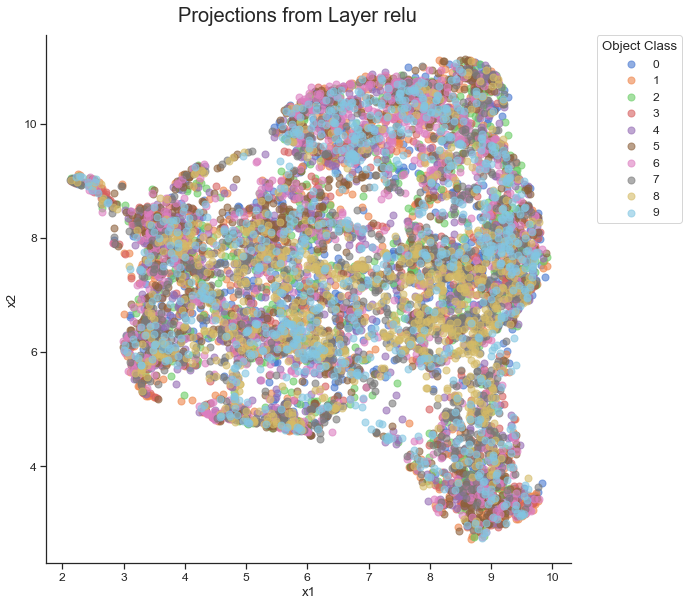

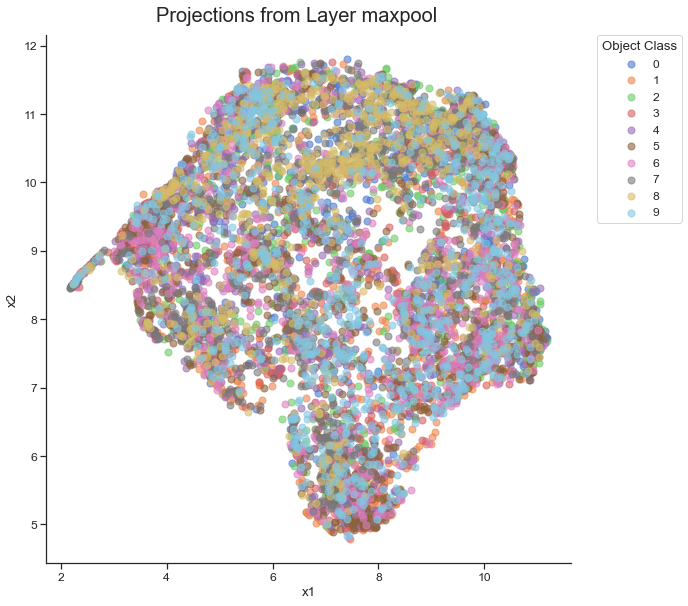

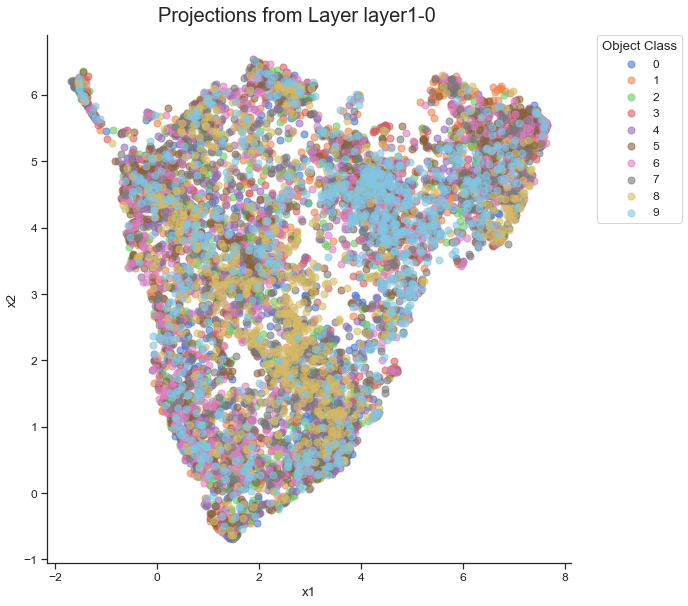

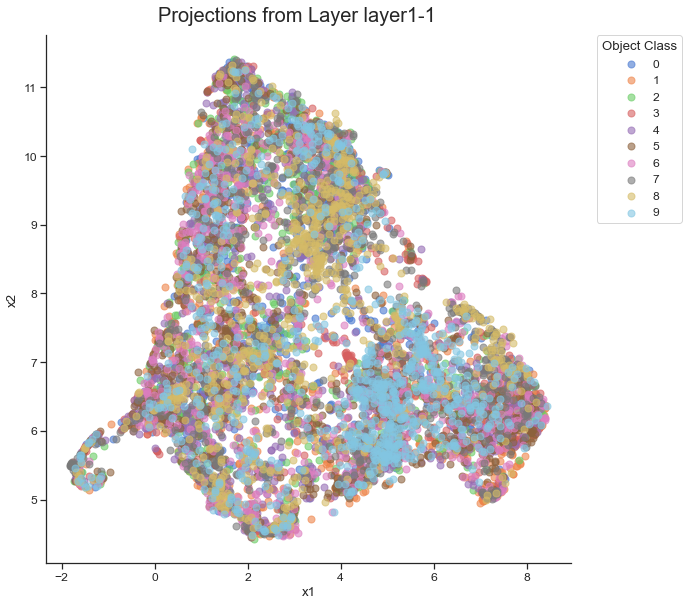

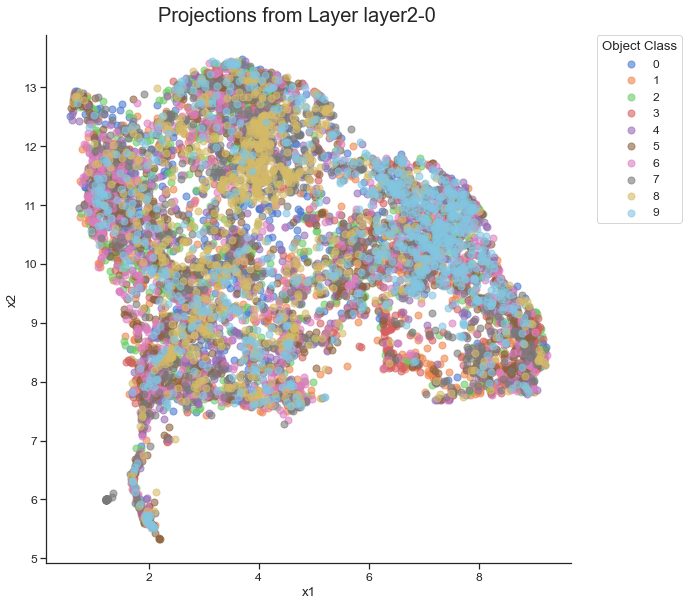

...

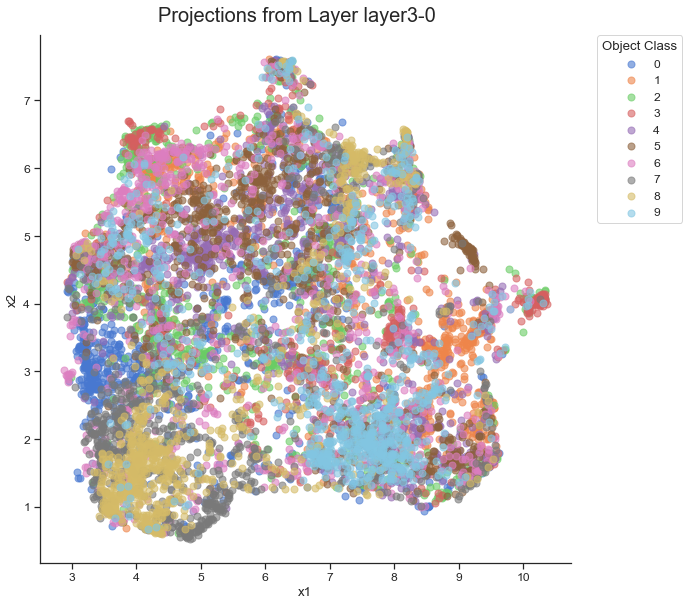

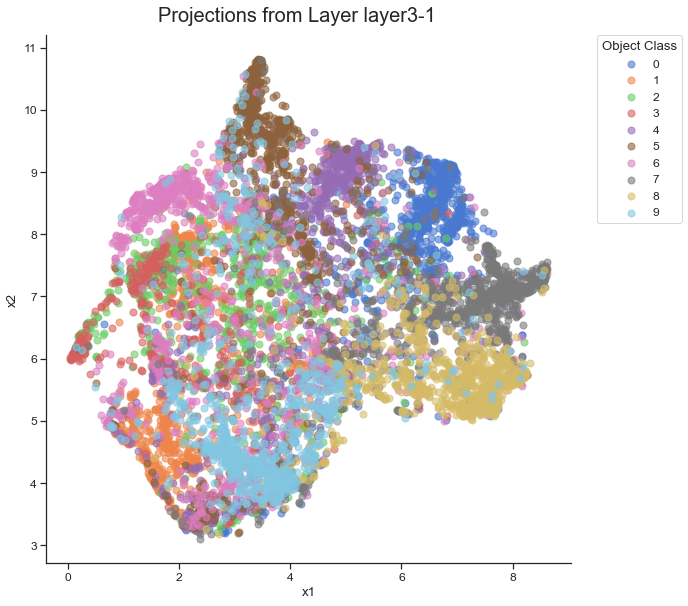

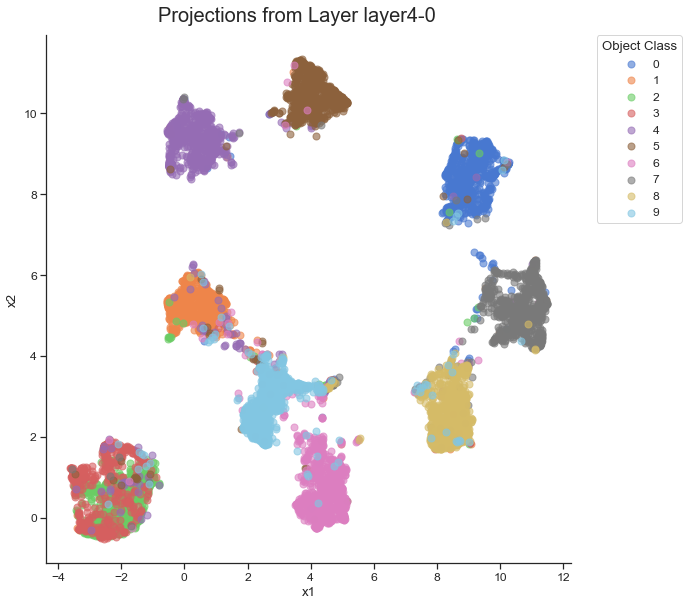

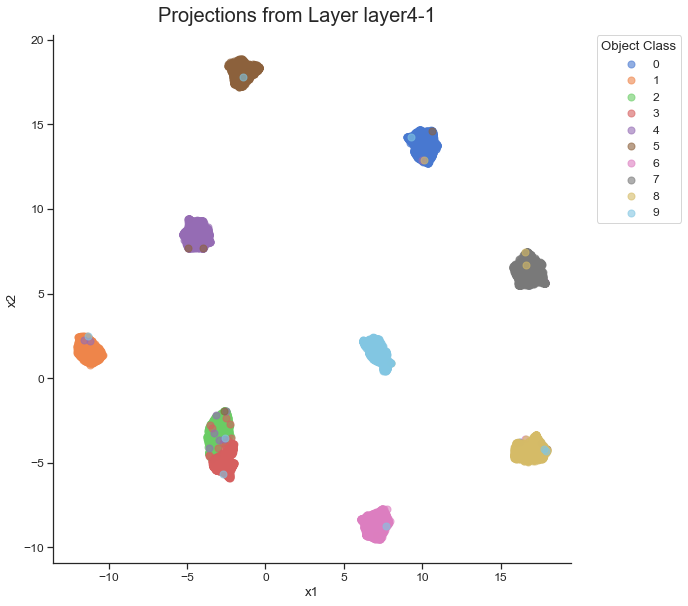

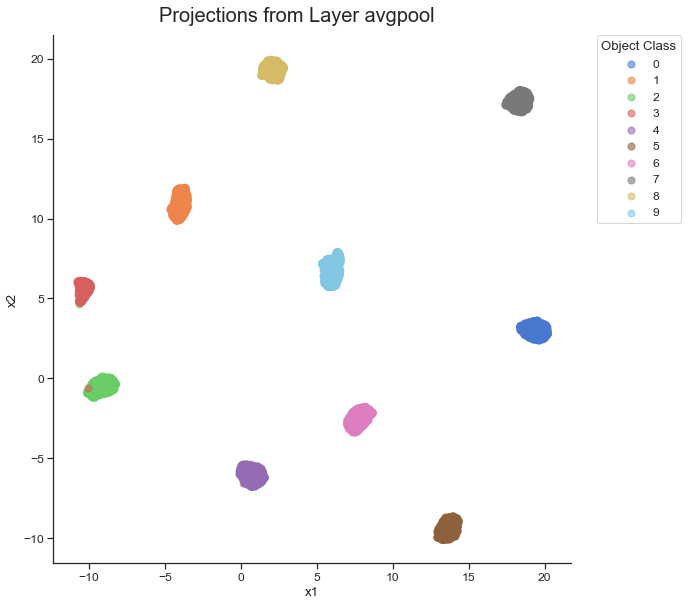

In [ ]:
plot_projects(loaded_train_projections)

## Search for Clusters in Training Projections

In [ ]:
def get_kmeans_clusters(projections, k_params):
    clusters = {}
    clusters['cluster_labels'] = {}
    clusters['cluster_centers'] = {}
    clusters['clusterer'] = {}
    clusters['eval'] = {}
    clusters['stats'] = {}
    
    sh_scores = []
    
    for layer_name in layer_names:
        print('## Searching Clusters for Layer {}'.format(layer_name))
        
        # Get clusters
        projects = projections['projections'][layer_name]
        
        best_sh_score = None
        best_clusterer = None
        
        for k in k_params:
            clusterer = KMeans(init='k-means++', n_clusters=k, n_init=10)
            clusterer.fit(projects)
            
            temp_sh_score = metrics.silhouette_score(projects, clusterer.labels_, metric='euclidean')
            
            if best_sh_score is None:
                best_sh_score = temp_sh_score
                best_clusterer = clusterer
            elif best_sh_score < temp_sh_score:
                best_sh_score = temp_sh_score
                best_clusterer = clusterer
        
        # Calculate cluster stats
        labels = best_clusterer.labels_
        targets = projections['targets']
        
        cluster_classes = dict([(i,[]) for i in np.unique(labels)])
        for i in range(len(labels)):
            cluster_classes[labels[i]].append(targets[i])
            
        for label in cluster_classes:
            total = len(cluster_classes[label])
            counts = dict(Counter(cluster_classes[label]))
            for c in counts:
                counts[c] /= total
            cluster_classes[label] = counts  
        
        # Save cluster result       
        clusters['cluster_labels'][layer_name] = best_clusterer.labels_
        clusters['cluster_centers'][layer_name] = best_clusterer.cluster_centers_
        clusters['clusterer'][layer_name] = best_clusterer
        clusters['eval'][layer_name] = best_sh_score
        clusters['stats'][layer_name] = cluster_classes
        
        sh_scores.append(best_sh_score)

        print('- clusters computed, Silhouette: {}'.format(best_sh_score))
        print()
    
    print()
    print('Total Silhouette: {}'.format(np.median(np.array(sh_scores))))
          
    return clusters

In [ ]:
k_range = list(range(num_classes-5,num_classes+6))
train_clusters = get_kmeans_clusters(loaded_train_projections, k_range)

## Searching Clusters for Layer relu
- clusters computed, Silhouette: 0.4520220458507538

## Searching Clusters for Layer maxpool
- clusters computed, Silhouette: 0.44885408878326416

## Searching Clusters for Layer layer1-0
- clusters computed, Silhouette: 0.4480409324169159

## Searching Clusters for Layer layer1-1
- clusters computed, Silhouette: 0.4547644257545471

## Searching Clusters for Layer layer2-0
- clusters computed, Silhouette: 0.4546440541744232

## Searching Clusters for Layer layer2-1
- clusters computed, Silhouette: 0.4574968218803406

## Searching Clusters for Layer layer3-0
- clusters computed, Silhouette: 0.43006473779678345

## Searching Clusters for Layer layer3-1
- clusters computed, Silhouette: 0.42483648657798767

## Searching Clusters for Layer layer4-0
- clusters computed, Silhouette: 0.7223285436630249

## Searching Clusters for Layer layer4-1
- clusters computed, Silhouette: 0.9051547646522522

## Searching Clusters for Layer avgpool
- clusters computed, S

In [ ]:
for layer_name in layer_names:
    print('## layer {}'.format(layer_name))
    print('cluster labels:  {}'.format(train_clusters['cluster_labels'][layer_name].shape))
    print('cluster centers: {}'.format(train_clusters['cluster_centers'][layer_name].shape))
    print('clusterer:       {}'.format(train_clusters['clusterer'][layer_name]))
    print()

## layer relu
cluster labels:  (9025,)
cluster centers: (5, 2)
clusterer:       KMeans(n_clusters=5)

## layer maxpool
cluster labels:  (9025,)
cluster centers: (6, 2)
clusterer:       KMeans(n_clusters=6)

## layer layer1-0
cluster labels:  (9025,)
cluster centers: (7, 2)
clusterer:       KMeans(n_clusters=7)

## layer layer1-1
cluster labels:  (9025,)
cluster centers: (8, 2)
clusterer:       KMeans()

## layer layer2-0
cluster labels:  (9025,)
cluster centers: (9, 2)
clusterer:       KMeans(n_clusters=9)

## layer layer2-1
cluster labels:  (9025,)
cluster centers: (9, 2)
clusterer:       KMeans(n_clusters=9)

## layer layer3-0
cluster labels:  (9025,)
cluster centers: (6, 2)
clusterer:       KMeans(n_clusters=6)

## layer layer3-1
cluster labels:  (9025,)
cluster centers: (13, 2)
clusterer:       KMeans(n_clusters=13)

## layer layer4-0
cluster labels:  (9025,)
cluster centers: (9, 2)
clusterer:       KMeans(n_clusters=9)

## layer layer4-1
cluster labels:  (9025,)
cluster centers: (

In [ ]:
pprint.pprint(train_clusters['stats'])

{'avgpool': {0: {0: 0.001075268817204301,
                 6: 0.001075268817204301,
                 7: 0.9978494623655914},
             1: {8: 0.0010626992561105207, 9: 0.9989373007438895},
             2: {1: 0.0010526315789473684, 4: 0.9989473684210526},
             3: {2: 0.0034423407917383822, 3: 0.9965576592082617},
             4: {8: 1.0},
             5: {0: 1.0},
             6: {5: 1.0},
             7: {1: 1.0},
             8: {6: 1.0},
             9: {2: 0.9989258861439313, 3: 0.0010741138560687433}},
 'layer1-0': {0: {0: 0.06841339155749636,
                  1: 0.10771470160116449,
                  2: 0.06841339155749636,
                  3: 0.09679767103347889,
                  4: 0.09388646288209607,
                  5: 0.09388646288209607,
                  6: 0.0851528384279476,
                  7: 0.08151382823871907,
                  8: 0.053857350800582245,
                  9: 0.25036390101892286},
              1: {0: 0.10317460317460317,
             

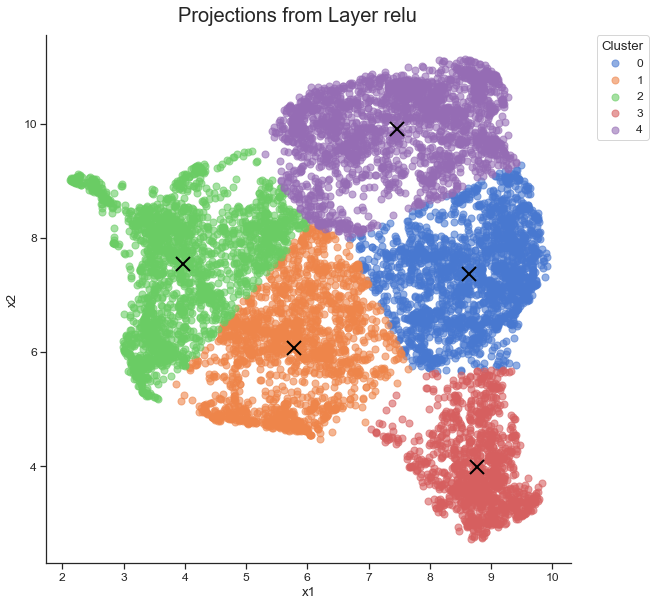

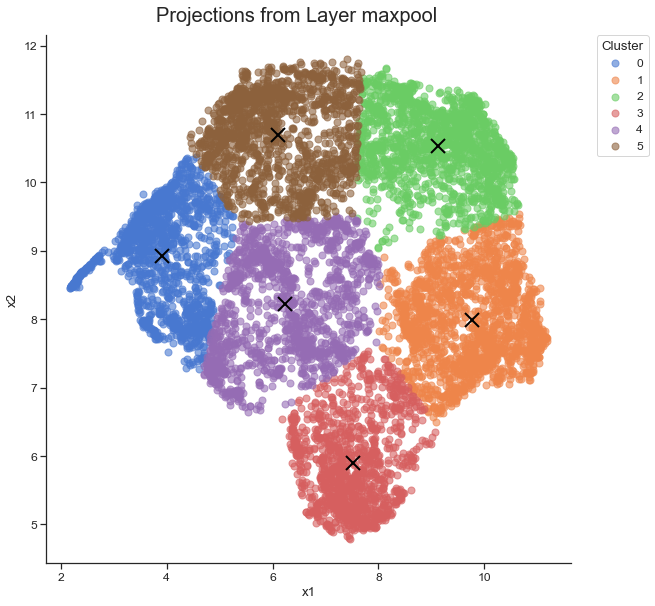

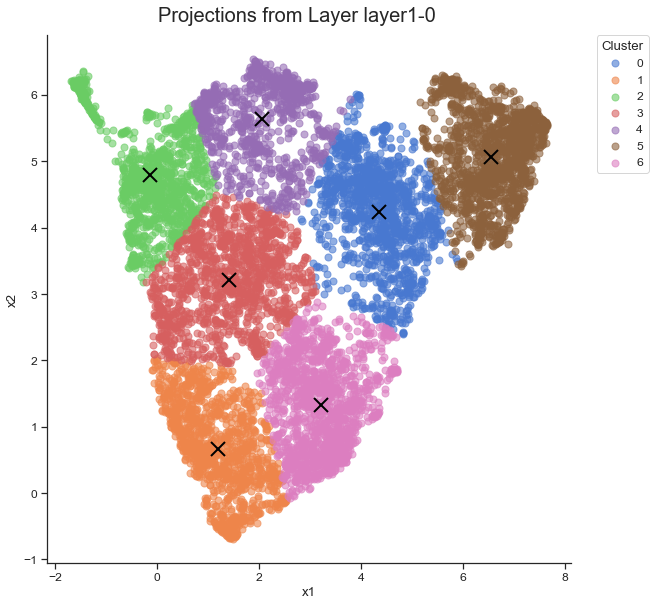

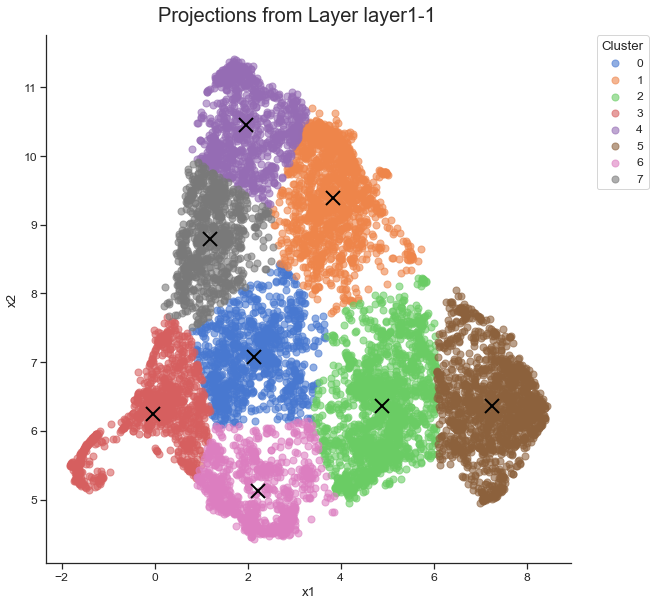

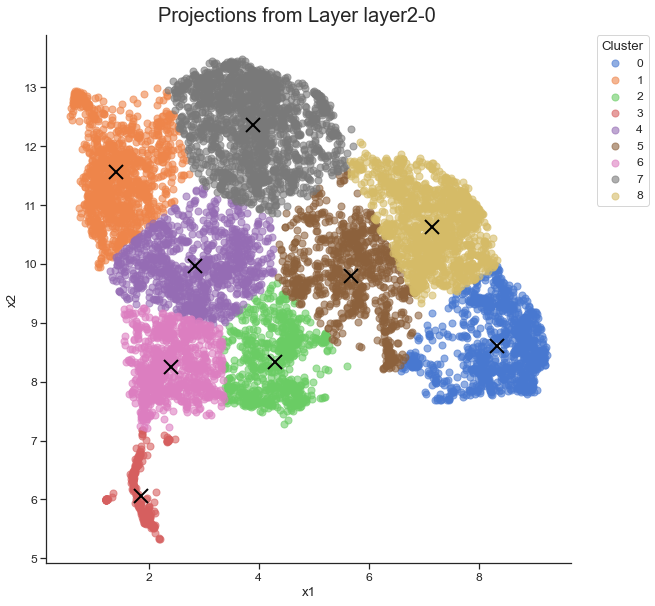

...

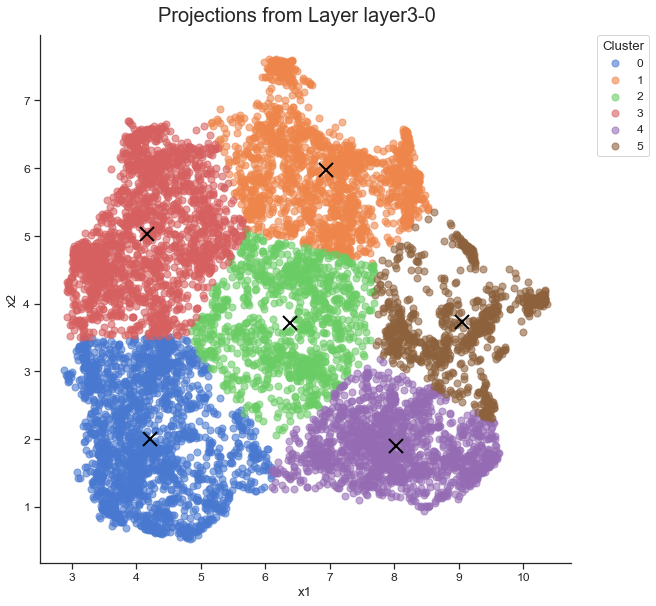

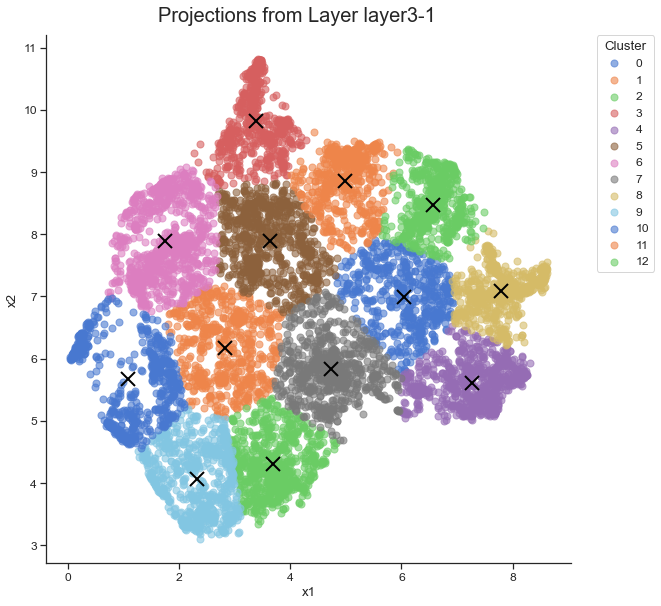

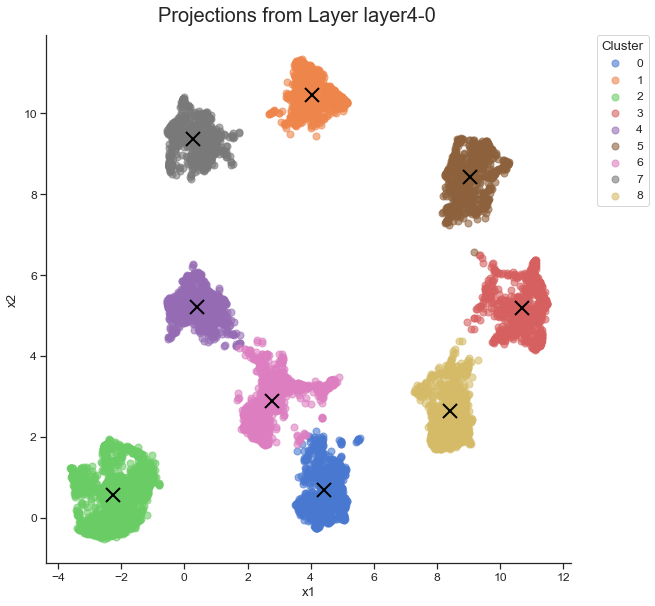

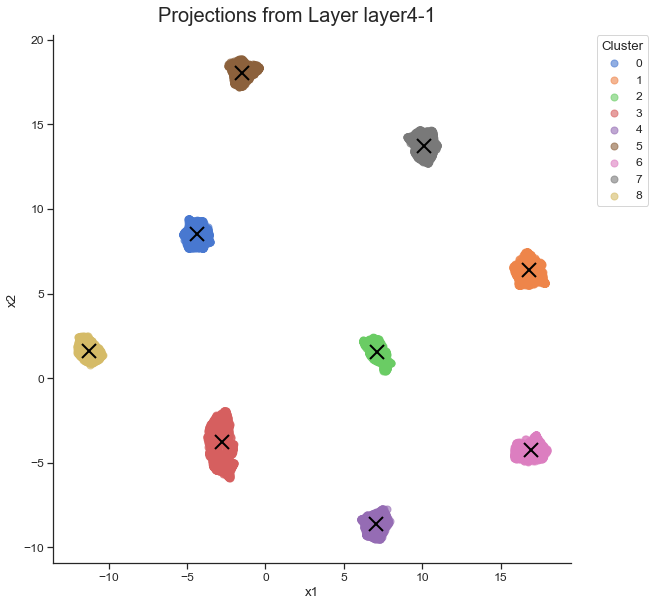

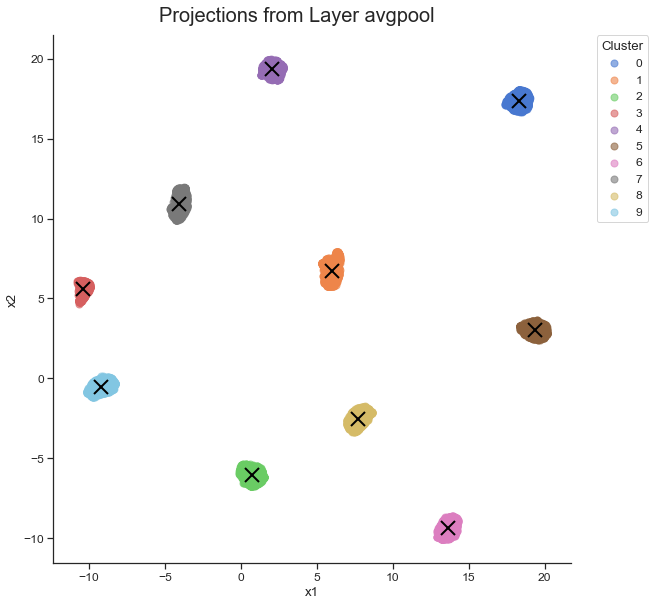

In [ ]:
plot_projects(loaded_train_projections, train_clusters['cluster_labels'], train_clusters['cluster_centers'])

## Get Layer Weights

In [ ]:
def get_weights(stats, clusters):
    weights = {}
    sum_weights = 0.0
    
    # for each layer get the layer weight
    for layer_name in layer_names:
        weights[layer_name] = get_layer_weight(stats, layer_name, clusters)
        sum_weights += weights[layer_name]
       
    # normalize the weights and round each normalized weight to 2 decimal places
    for layer_name in weights:
        weights[layer_name] = round(weights[layer_name] / sum_weights, 2)
    
    return weights

def get_layer_weight(stats, layer_name, clusters):
    max_diffs = []
    
    # go through all clusters of the layer and find the difference between the class with the 
    # highest and the class with the second highest percentage (difference of the two percentages)
    for i in clusters['stats'][layer_name]:
        
        # find the class with the highest percentage and its percentage
        max1 = 0.0
        argmax1 = -1
        for j in clusters['stats'][layer_name][i]:
            if clusters['stats'][layer_name][i][j] > max1:
                max1 = clusters['stats'][layer_name][i][j]
                argmax1 = j
           
        # find the second highest percentage
        max2 = 0.0
        for j in clusters['stats'][layer_name][i]:
            if clusters['stats'][layer_name][i][j] > max2 and j != argmax1:
                max2 = clusters['stats'][layer_name][i][j]
            
        max_diffs += [max1 - max2]

    # take the average of the differences to obtain the layer weight
    layer_weight = sum(max_diffs) / len(max_diffs)
    return round(layer_weight, 3)

In [ ]:
layer_weights = get_weights(train_clusters['stats'], train_clusters) 

pprint.pprint(layer_weights); print()
print(f"sum = {sum(layer_weights.values())}")

{'avgpool': 0.3,
 'layer1-0': 0.01,
 'layer1-1': 0.01,
 'layer2-0': 0.01,
 'layer2-1': 0.01,
 'layer3-0': 0.02,
 'layer3-1': 0.11,
 'layer4-0': 0.25,
 'layer4-1': 0.27,
 'maxpool': 0.01,
 'relu': 0.0}

sum = 1.0


## Load Calibration Set Projections

In [ ]:
loaded_calibset_projections = {}

fname = str(projs_path) + '_{}_all.pkl'.format('calibset')
with open(fname, 'rb') as pickle_file:
    loaded_calibset_projections = pickle.load(pickle_file)

In [ ]:
print('targets: {}'.format(loaded_calibset_projections['targets'].shape))
print()

for layer_name in layer_names:
    print('## layer {}'.format(layer_name))
    print('projections: {}'.format(loaded_calibset_projections['projections'][layer_name].shape))
    print('scaler:      {}'.format(loaded_calibset_projections['scaler'][layer_name]))
    print('reducer:     {}'.format(loaded_calibset_projections['reducer'][layer_name]))
    print()

targets: (750,)

## layer relu
projections: (750, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer maxpool
projections: (750, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer layer1-0
projections: (750, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer layer1-1
projections: (750, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer layer2-0
projections: (750, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.0)]

## layer layer2-1
projections: (750, 2)
scaler:      StandardScaler()
reducer:     [PCA(n_components=50), UMAP(angular_rp_forest=True, metric='cosin

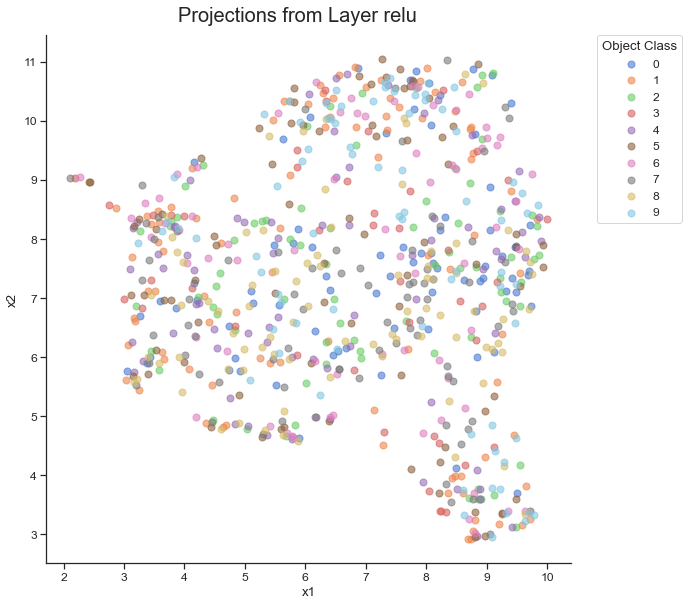

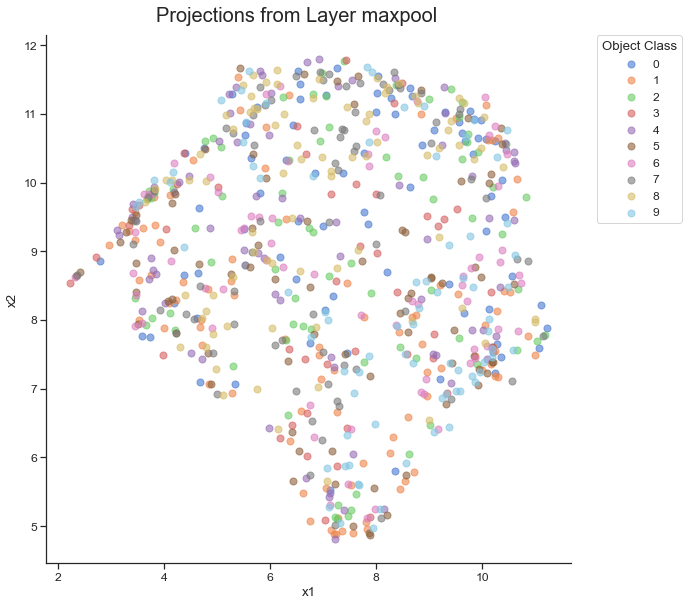

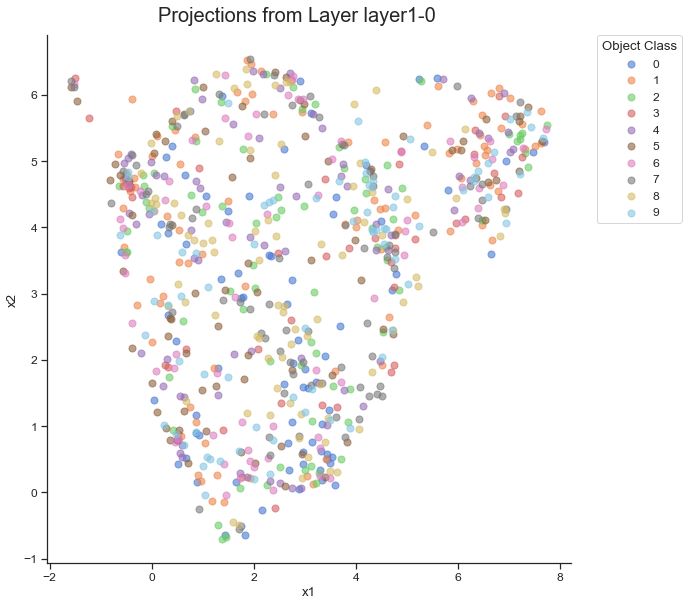

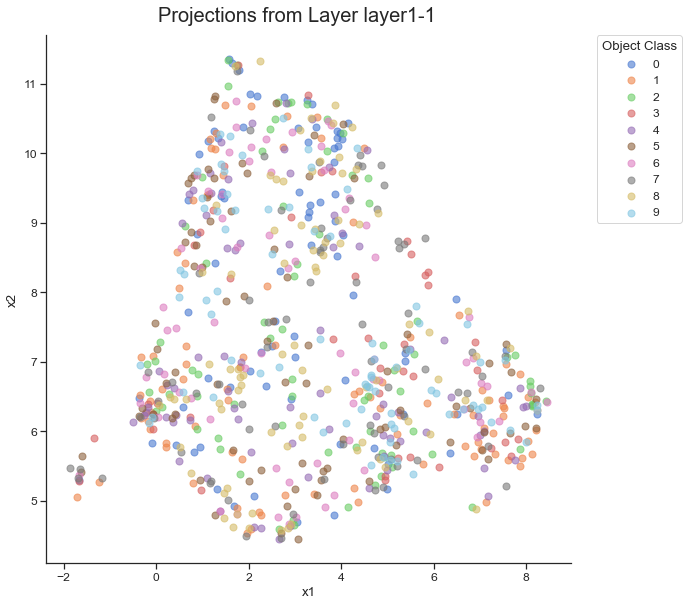

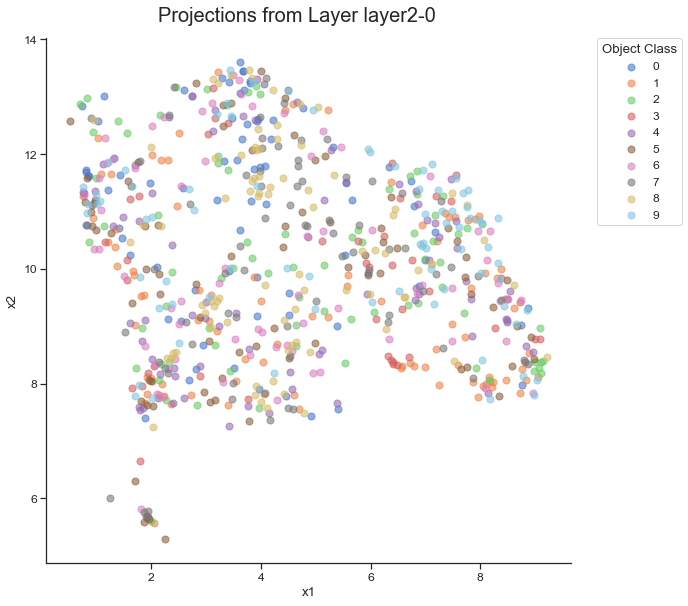

...

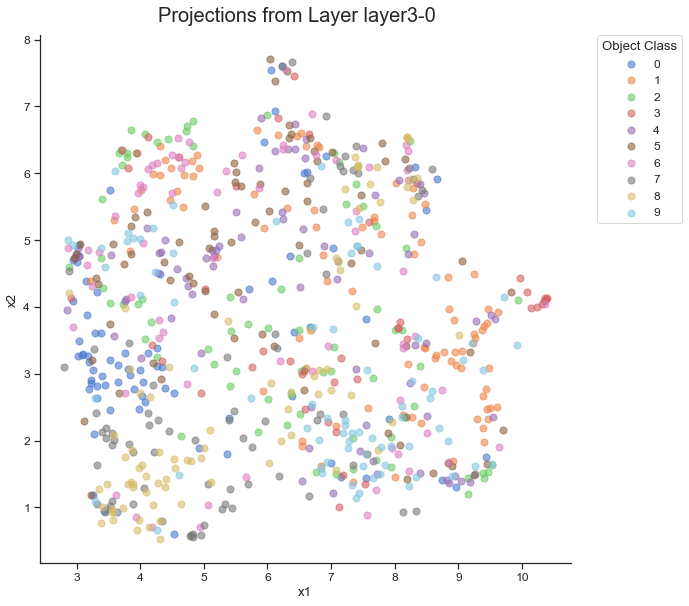

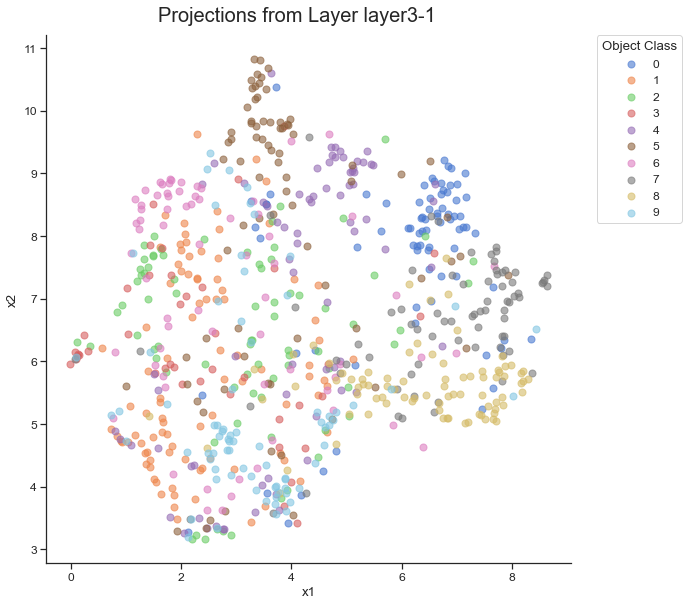

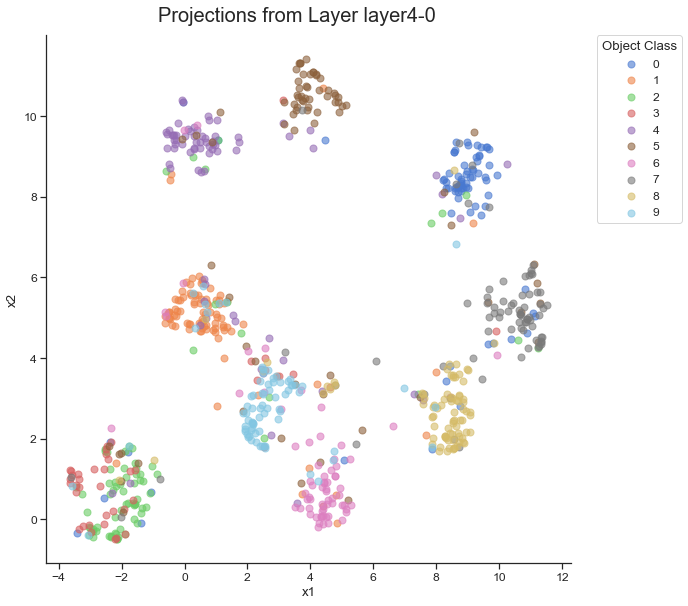

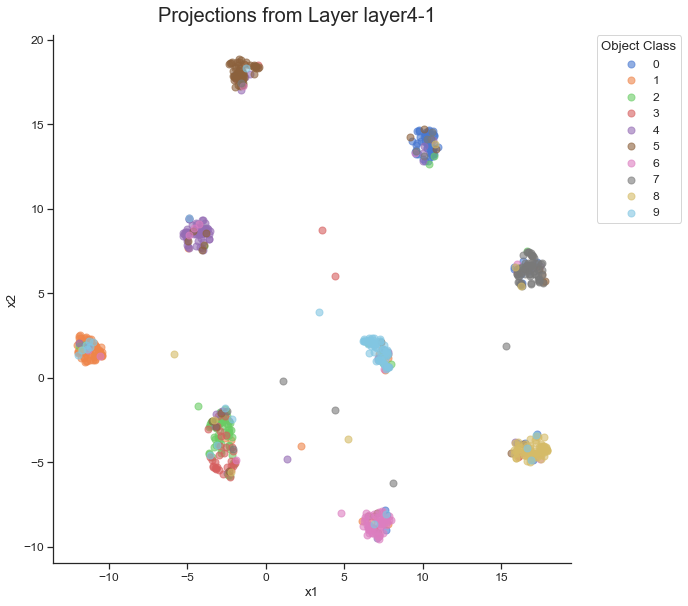

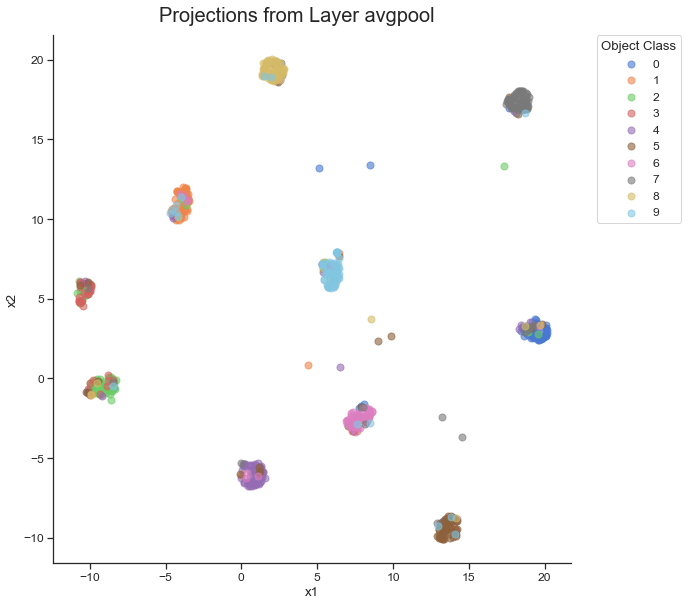

In [ ]:
plot_projects(loaded_calibset_projections)

## Get Cluster Labels for Calibration Set Projections

In [ ]:
def get_labels(projs, clusterer):
    labels = {}
    for layer_name in layer_names:
        labels[layer_name] = clusterer[layer_name].predict(projs[layer_name])
        
    return labels

In [ ]:
calib_labels = get_labels(loaded_calibset_projections['projections'], train_clusters['clusterer'])

In [ ]:
for layer_name in layer_names:
    print('## layer {}'.format(layer_name))
    print('cluster labels:  {}'.format(calib_labels[layer_name].shape))
    print()

## layer relu
cluster labels:  (750,)

## layer maxpool
cluster labels:  (750,)

## layer layer1-0
cluster labels:  (750,)

## layer layer1-1
cluster labels:  (750,)

## layer layer2-0
cluster labels:  (750,)

## layer layer2-1
cluster labels:  (750,)

## layer layer3-0
cluster labels:  (750,)

## layer layer3-1
cluster labels:  (750,)

## layer layer4-0
cluster labels:  (750,)

## layer layer4-1
cluster labels:  (750,)

## layer avgpool
cluster labels:  (750,)



## Calculate Class Label Distribution of Calibration Set Clusters

In [ ]:
def get_class_label_calib_distro(stats, projections, labels, t=0.01):
    class_label_distro = {}
    num_samples = len(projections['targets'])

    # for each layer get a dict of (key: class, value: label list) for the calib set
    for layer_name in layer_names:
        class_label_distro[layer_name] = {}
        
        # for each sample check its label and add it to the dict if it is not an outlier
        for i in range(num_samples):
            label = labels[layer_name][i]
            target = projections['targets'][i]
            
            # add label only if that class is not an outlier in that cluster
            if target in stats[layer_name][label] and stats[layer_name][label][target] > t:
                if target in class_label_distro[layer_name].keys():
                    class_label_distro[layer_name][target] += [label]
                else:
                    class_label_distro[layer_name][target] = [label]
          
    # for each layer get a dict of (key: class, value: dict of (key: label, value: percentage)) of calib set
    for layer_name in layer_names:
        
        # for each class calculate the percentage of each label
        for c in class_label_distro[layer_name]:
            total = len(class_label_distro[layer_name][c])
            counts = dict(Counter(class_label_distro[layer_name][c]))
        
            for i in counts:
                counts[i] /= total
            
            class_label_distro[layer_name][c] = counts
            
    return class_label_distro

def get_class_label_calib_distro_t(stats, projections, labels, thresholds):
    result = {}
        
    for i in range(len(thresholds)):
        result[thresholds[i]] = class_label_calib_distro = get_class_label_calib_distro(
            stats, projections, labels, thresholds[i]
        )
        
    return result

In [ ]:
thresholds = [0.01,0.05,0.1]

class_label_calib_distro = get_class_label_calib_distro_t(
    train_clusters['stats'],
    loaded_calibset_projections, 
    calib_labels,
    thresholds
)

In [ ]:
pprint.pprint(class_label_calib_distro)

{0.01: {'avgpool': {0: {5: 1.0},
                    1: {7: 1.0},
                    2: {9: 1.0},
                    3: {3: 1.0},
                    4: {2: 1.0},
                    5: {6: 1.0},
                    6: {8: 1.0},
                    7: {0: 1.0},
                    8: {4: 1.0},
                    9: {1: 1.0}},
        'layer1-0': {0: {0: 0.0759493670886076,
                         1: 0.17721518987341772,
                         2: 0.10126582278481013,
                         3: 0.1518987341772152,
                         4: 0.06329113924050633,
                         5: 0.10126582278481013,
                         6: 0.3291139240506329},
                     1: {0: 0.12903225806451613,
                         1: 0.13978494623655913,
                         2: 0.20430107526881722,
                         3: 0.10752688172043011,
                         4: 0.08602150537634409,
                         5: 0.27956989247311825,
                         6: 0.0537

                         4: 0.07894736842105263,
                         5: 0.06578947368421052,
                         6: 0.18421052631578946,
                         7: 0.11842105263157894,
                         8: 0.17105263157894737},
                     5: {0: 0.14102564102564102,
                         1: 0.1794871794871795,
                         2: 0.07692307692307693,
                         3: 0.05128205128205128,
                         4: 0.08974358974358974,
                         5: 0.11538461538461539,
                         6: 0.1282051282051282,
                         7: 0.1282051282051282,
                         8: 0.08974358974358974},
                     6: {0: 0.11594202898550725,
                         1: 0.17391304347826086,
                         2: 0.15942028985507245,
                         3: 0.014492753623188406,
                         4: 0.07246376811594203,
                         5: 0.08695652173913043,
                    

## Store Clusters and Stats

In [ ]:
clusters_and_stats = {}
clusters_and_stats['train_clusters'] = train_clusters
clusters_and_stats['layer_weights'] = layer_weights
clusters_and_stats['calib_stats'] = class_label_calib_distro

In [ ]:
fname = str(cstats_path)+'.pkl'
with open(fname, 'wb') as pickle_file:
    pickle.dump(clusters_and_stats, pickle_file)

In [ ]:
fname = str(cstats_path)+'.pkl'
with open(fname, 'rb') as pickle_file:
    loaded_clusters_and_stats = pickle.load(pickle_file)

In [ ]:
for layer_name in layer_names:
    print('## layer {}'.format(layer_name))
    print('cluster labels:  {}'.format(loaded_clusters_and_stats['train_clusters']['cluster_labels'][layer_name].shape))
    print('cluster centers: {}'.format(loaded_clusters_and_stats['train_clusters']['cluster_centers'][layer_name].shape))
    print('clusterer:       {}'.format(loaded_clusters_and_stats['train_clusters']['clusterer'][layer_name]))
    print()

## layer relu
cluster labels:  (9025,)
cluster centers: (5, 2)
clusterer:       KMeans(n_clusters=5)

## layer maxpool
cluster labels:  (9025,)
cluster centers: (6, 2)
clusterer:       KMeans(n_clusters=6)

## layer layer1-0
cluster labels:  (9025,)
cluster centers: (7, 2)
clusterer:       KMeans(n_clusters=7)

## layer layer1-1
cluster labels:  (9025,)
cluster centers: (8, 2)
clusterer:       KMeans()

## layer layer2-0
cluster labels:  (9025,)
cluster centers: (9, 2)
clusterer:       KMeans(n_clusters=9)

## layer layer2-1
cluster labels:  (9025,)
cluster centers: (9, 2)
clusterer:       KMeans(n_clusters=9)

## layer layer3-0
cluster labels:  (9025,)
cluster centers: (6, 2)
clusterer:       KMeans(n_clusters=6)

## layer layer3-1
cluster labels:  (9025,)
cluster centers: (13, 2)
clusterer:       KMeans(n_clusters=13)

## layer layer4-0
cluster labels:  (9025,)
cluster centers: (9, 2)
clusterer:       KMeans(n_clusters=9)

## layer layer4-1
cluster labels:  (9025,)
cluster centers: (

In [ ]:
pprint.pprint(loaded_clusters_and_stats['train_clusters']['stats'])

{'avgpool': {0: {0: 0.001075268817204301,
                 6: 0.001075268817204301,
                 7: 0.9978494623655914},
             1: {8: 0.0010626992561105207, 9: 0.9989373007438895},
             2: {1: 0.0010526315789473684, 4: 0.9989473684210526},
             3: {2: 0.0034423407917383822, 3: 0.9965576592082617},
             4: {8: 1.0},
             5: {0: 1.0},
             6: {5: 1.0},
             7: {1: 1.0},
             8: {6: 1.0},
             9: {2: 0.9989258861439313, 3: 0.0010741138560687433}},
 'layer1-0': {0: {0: 0.06841339155749636,
                  1: 0.10771470160116449,
                  2: 0.06841339155749636,
                  3: 0.09679767103347889,
                  4: 0.09388646288209607,
                  5: 0.09388646288209607,
                  6: 0.0851528384279476,
                  7: 0.08151382823871907,
                  8: 0.053857350800582245,
                  9: 0.25036390101892286},
              1: {0: 0.10317460317460317,
             

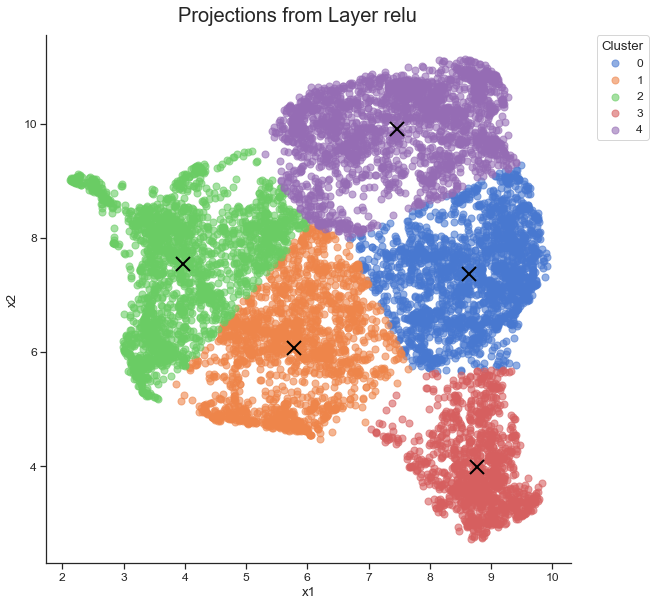

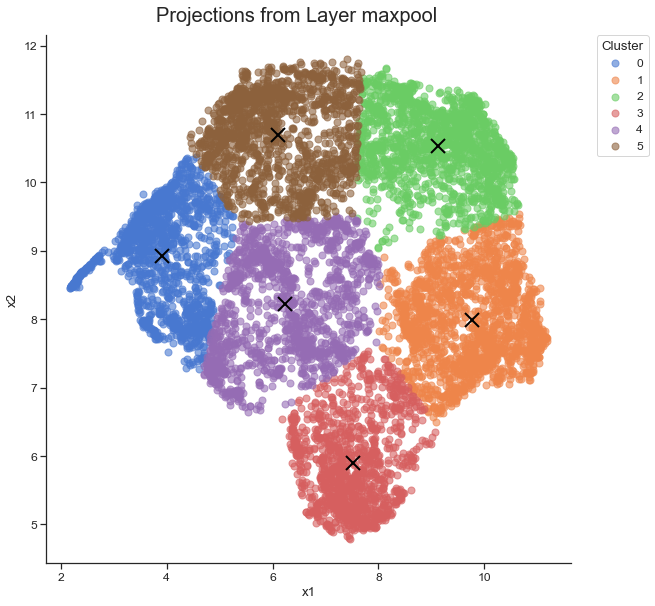

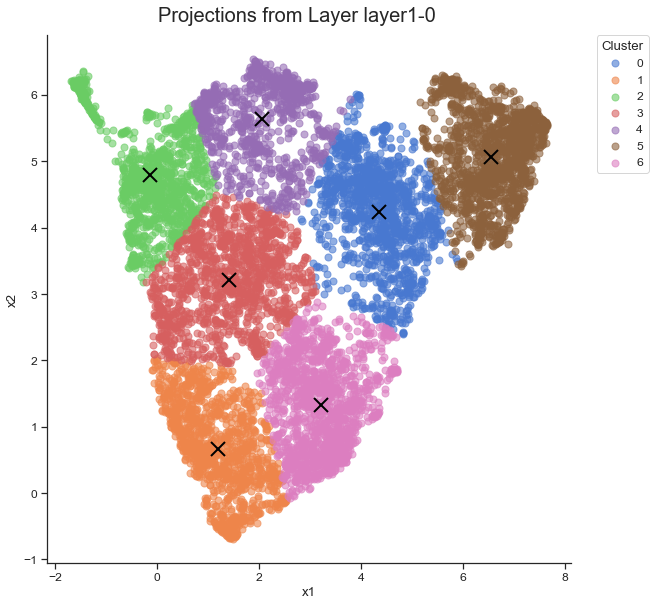

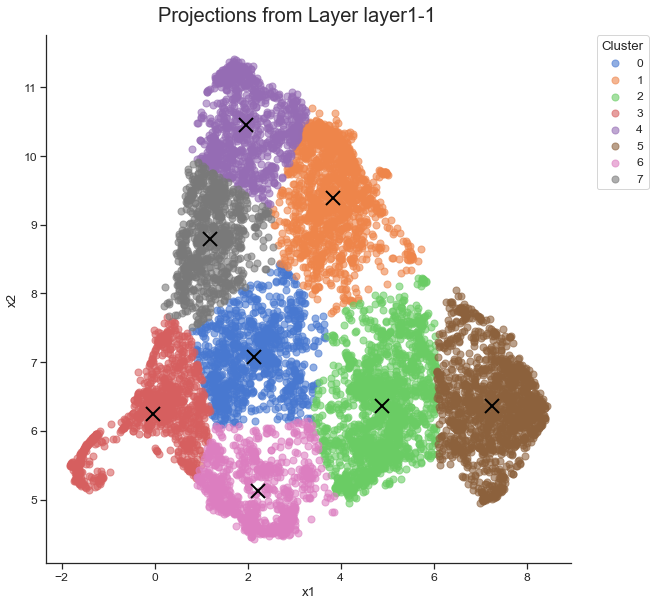

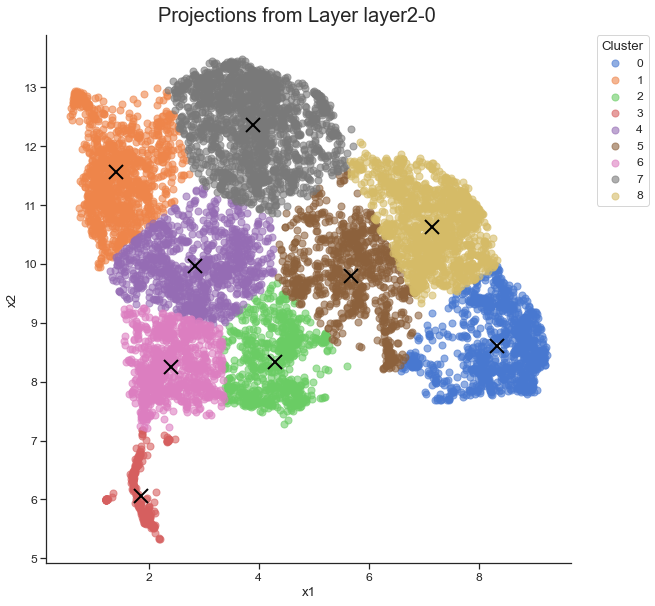

...

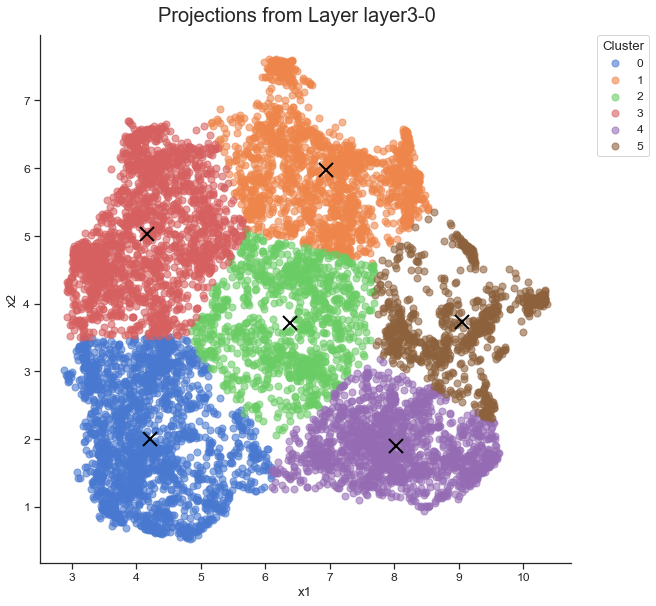

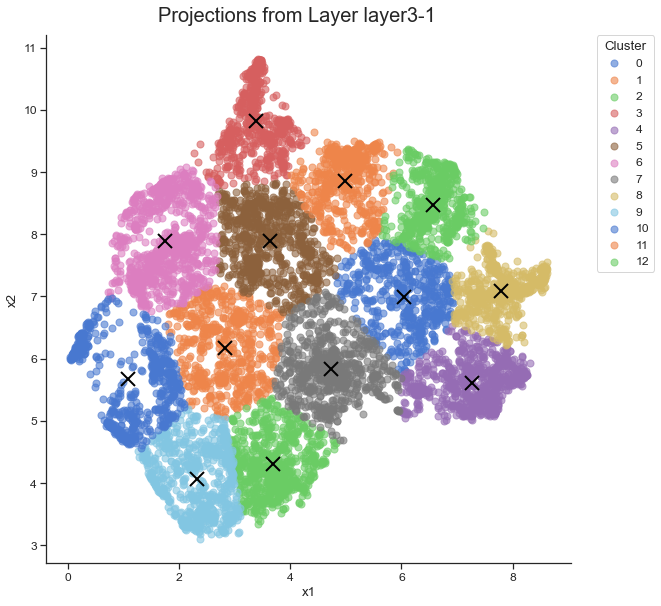

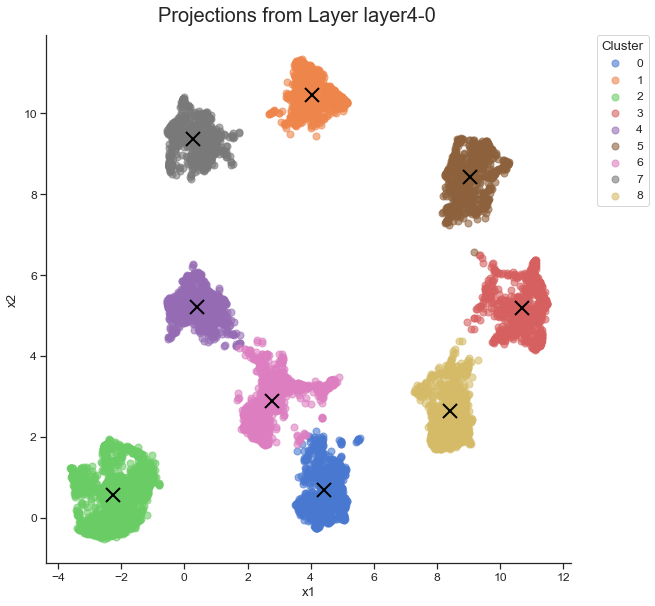

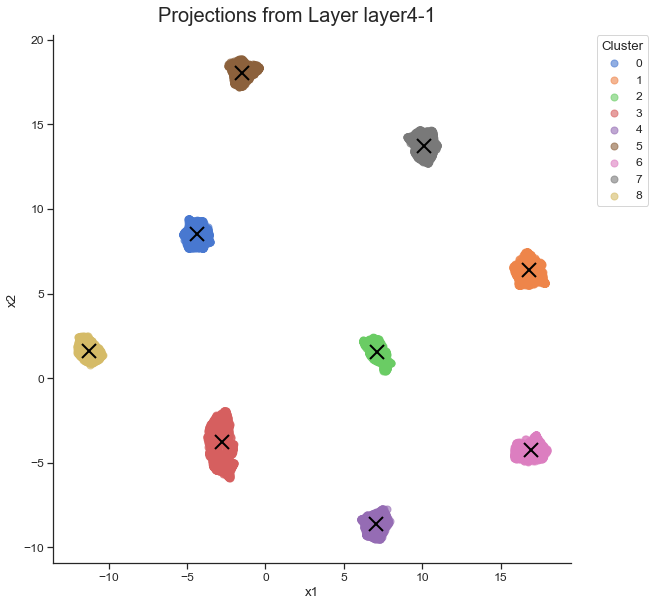

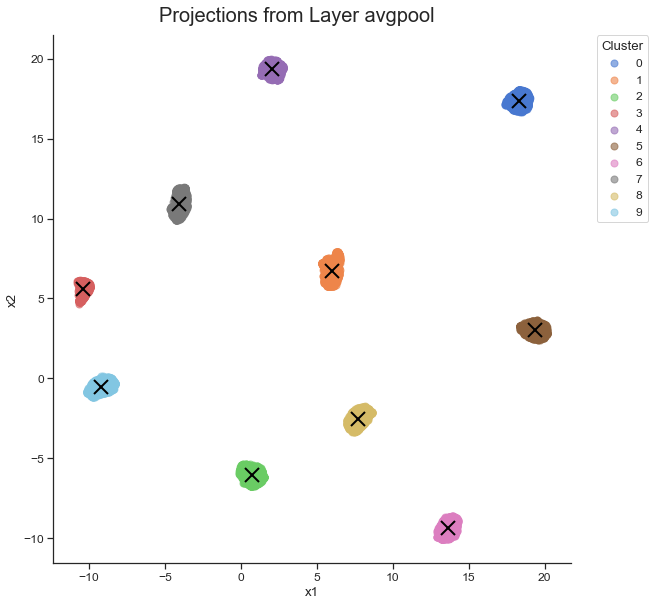

In [ ]:
plot_projects(
    loaded_train_projections, 
    loaded_clusters_and_stats['train_clusters']['cluster_labels'], 
    loaded_clusters_and_stats['train_clusters']['cluster_centers']
)

In [ ]:
pprint.pprint(loaded_clusters_and_stats['layer_weights']); print()
print(f"sum = {sum(loaded_clusters_and_stats['layer_weights'].values())}")

{'avgpool': 0.3,
 'layer1-0': 0.01,
 'layer1-1': 0.01,
 'layer2-0': 0.01,
 'layer2-1': 0.01,
 'layer3-0': 0.02,
 'layer3-1': 0.11,
 'layer4-0': 0.25,
 'layer4-1': 0.27,
 'maxpool': 0.01,
 'relu': 0.0}

sum = 1.0


In [ ]:
pprint.pprint(loaded_clusters_and_stats['calib_stats'])

{0.01: {'avgpool': {0: {5: 1.0},
                    1: {7: 1.0},
                    2: {9: 1.0},
                    3: {3: 1.0},
                    4: {2: 1.0},
                    5: {6: 1.0},
                    6: {8: 1.0},
                    7: {0: 1.0},
                    8: {4: 1.0},
                    9: {1: 1.0}},
        'layer1-0': {0: {0: 0.0759493670886076,
                         1: 0.17721518987341772,
                         2: 0.10126582278481013,
                         3: 0.1518987341772152,
                         4: 0.06329113924050633,
                         5: 0.10126582278481013,
                         6: 0.3291139240506329},
                     1: {0: 0.12903225806451613,
                         1: 0.13978494623655913,
                         2: 0.20430107526881722,
                         3: 0.10752688172043011,
                         4: 0.08602150537634409,
                         5: 0.27956989247311825,
                         6: 0.0537

                         4: 0.05333333333333334,
                         5: 0.10666666666666667,
                         6: 0.12,
                         7: 0.013333333333333334},
                     8: {0: 0.1566265060240964,
                         1: 0.26506024096385544,
                         2: 0.14457831325301204,
                         3: 0.07228915662650602,
                         4: 0.060240963855421686,
                         5: 0.08433734939759036,
                         6: 0.1686746987951807,
                         7: 0.04819277108433735},
                     9: {0: 0.06493506493506493,
                         1: 0.09090909090909091,
                         2: 0.35064935064935066,
                         3: 0.05194805194805195,
                         4: 0.07792207792207792,
                         5: 0.16883116883116883,
                         7: 0.19480519480519481}},
        'layer2-0': {0: {1: 0.2,
                         2: 0.09333333333333334

                       5: 0.425531914893617},
                   8: {2: 0.46808510638297873, 5: 0.5319148936170213},
                   9: {1: 0.5961538461538461,
                       3: 0.3269230769230769,
                       4: 0.07692307692307693}},
       'relu': {0: {0: 0.6666666666666666, 1: 0.3333333333333333},
                1: {2: 0.3424657534246575,
                    3: 0.2465753424657534,
                    4: 0.410958904109589},
                2: {0: 0.6176470588235294, 4: 0.38235294117647056},
                4: {2: 0.5116279069767442,
                    3: 0.18604651162790697,
                    4: 0.3023255813953488},
                5: {2: 0.35714285714285715,
                    3: 0.21428571428571427,
                    4: 0.42857142857142855},
                6: {1: 0.35294117647058826, 4: 0.6470588235294118},
                7: {0: 0.47058823529411764,
                    1: 0.35294117647058826,
                    3: 0.17647058823529413},
             